In [1]:
!git clone https://github.com/brunoaugustoam/MorphologyAnalysisFromSegmentation.git

!mv /content/MorphologyAnalysisFromSegmentation/SAM-BasedMethod/particle_loader.py /content/
!mv /content/MorphologyAnalysisFromSegmentation/SAM-BasedMethod/particle_seg.py /content/
!mv /content/MorphologyAnalysisFromSegmentation/SAM-BasedMethod/plots.py /content/


Cloning into 'MorphologyAnalysisFromSegmentation'...
remote: Enumerating objects: 73, done.
remote: Counting objects: 100% (8/8), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 73 (delta 0), reused 3 (delta 0), pack-reused 65
Receiving objects: 100% (73/73), 76.66 MiB | 13.46 MiB/s, done.
Resolving deltas: 100% (3/3), done.


In [2]:
from particle_seg import *
from particle_loader import *
from plots import *

import os
import pandas as pd

ratio = 300/68

In [3]:
using_colab = True
if using_colab:

    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    if os.path.exists('/content/sam_vit_h_4b8939.pth'):
      print('ok')
    else:
      !{sys.executable} -m pip install opencv-python matplotlib
      !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

      !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth



PyTorch version: 2.1.0+cu121
Torchvision version: 0.16.0+cu121
CUDA is available: True
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-vp0brjbl
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-vp0brjbl
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36587 sha256=207063c093d8311d0a2cf96598c04235680336107fc5c75eea3a0a3baab57338
  Stored in directory: /tmp/pip-ephem-wheel-cache-bn73kae0/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment-anything
--2024-03-01 15:24:35--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 52.84.251.114, 52.84.251.27, 5

In [4]:
img_idx='124'

if os.path.isdir('results'):
  print('ok')
else:
  !mkdir results

save_path = os.path.join(os.getcwd(),'results')
save_path

'/content/results'

In [5]:
sam_checkpoint = "sam_vit_h_4b8939.pth"

device = "cuda"
model_type = "vit_h"

from segment_anything import SamAutomaticMaskGenerator, sam_model_registry
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

print('ok')


ok


In [6]:
mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=36,
    pred_iou_thresh=0.80,
    stability_score_thresh=0.80,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=350,  # Requires open-cv to run post-processing
)

In [7]:
data_path = os.path.join(os.getcwd(),'MorphologyAnalysisFromSegmentation', 'Dataset', 'SEM')

In [8]:
img_set = Particle_Dataset(root =data_path,img_idx=img_idx)
print("Analinsando",img_set.__len__(),'imagens')
img_set.files

Analinsando 10 imagens


['GM 124_00.tif',
 'GM 124_01.tif',
 'GM 124_02.tif',
 'GM 124_03.tif',
 'GM 124_04.tif',
 'GM 124_05.tif',
 'GM 124_06.tif',
 'GM 124_07.tif',
 'GM 124_08.tif',
 'GM 124_09.tif']

0/10
Analizing particle: GM 124_00


/content/particle_seg.py:459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['ID'] = pd.factorize(filtered_df['best_cand'].apply(tuple))[0]
/content/particle_seg.py:562: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_particle.at[indexes[0], 'lobe'] = 'b'
/content/particle_seg.py:562: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/p

image from GM 124_00.tif saved!
1/10
Analizing particle: GM 124_01


/content/particle_seg.py:459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['ID'] = pd.factorize(filtered_df['best_cand'].apply(tuple))[0]
/content/particle_seg.py:592: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_particle.at[indexes[2], 'lobe'] = 'b'
/content/particle_seg.py:592: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/p

image from GM 124_01.tif saved!
2/10
Analizing particle: GM 124_02


/content/particle_seg.py:459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['ID'] = pd.factorize(filtered_df['best_cand'].apply(tuple))[0]
/content/particle_seg.py:562: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_particle.at[indexes[0], 'lobe'] = 'b'
/content/particle_seg.py:562: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/p

image from GM 124_02.tif saved!
3/10
Analizing particle: GM 124_03


/content/particle_seg.py:459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['ID'] = pd.factorize(filtered_df['best_cand'].apply(tuple))[0]
/content/particle_seg.py:592: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_particle.at[indexes[2], 'lobe'] = 'b'
/content/particle_seg.py:577: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/p

image from GM 124_03.tif saved!
4/10
Analizing particle: GM 124_04


/content/particle_seg.py:459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['ID'] = pd.factorize(filtered_df['best_cand'].apply(tuple))[0]
/content/particle_seg.py:592: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_particle.at[indexes[2], 'lobe'] = 'b'
/content/particle_seg.py:592: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/p

image from GM 124_04.tif saved!
5/10
Analizing particle: GM 124_05


/content/particle_seg.py:459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['ID'] = pd.factorize(filtered_df['best_cand'].apply(tuple))[0]
/content/particle_seg.py:577: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_particle.at[indexes[1], 'lobe'] = 'b'
/content/particle_seg.py:562: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/p

image from GM 124_05.tif saved!
6/10
Analizing particle: GM 124_06


/content/particle_seg.py:459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['ID'] = pd.factorize(filtered_df['best_cand'].apply(tuple))[0]
/content/particle_seg.py:592: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_particle.at[indexes[2], 'lobe'] = 'b'
/content/particle_seg.py:592: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/p

image from GM 124_06.tif saved!
7/10
Analizing particle: GM 124_07


/content/particle_seg.py:459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['ID'] = pd.factorize(filtered_df['best_cand'].apply(tuple))[0]
/content/particle_seg.py:592: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_particle.at[indexes[2], 'lobe'] = 'b'
/content/particle_seg.py:592: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/p

image from GM 124_07.tif saved!
8/10
Analizing particle: GM 124_08


/content/particle_seg.py:459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['ID'] = pd.factorize(filtered_df['best_cand'].apply(tuple))[0]
/content/particle_seg.py:592: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_particle.at[indexes[2], 'lobe'] = 'b'
/content/particle_seg.py:592: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/p

image from GM 124_08.tif saved!
9/10
Analizing particle: GM 124_09


/content/particle_seg.py:459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['ID'] = pd.factorize(filtered_df['best_cand'].apply(tuple))[0]
/content/particle_seg.py:592: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_particle.at[indexes[2], 'lobe'] = 'b'
/content/particle_seg.py:577: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/p

image from GM 124_09.tif saved!


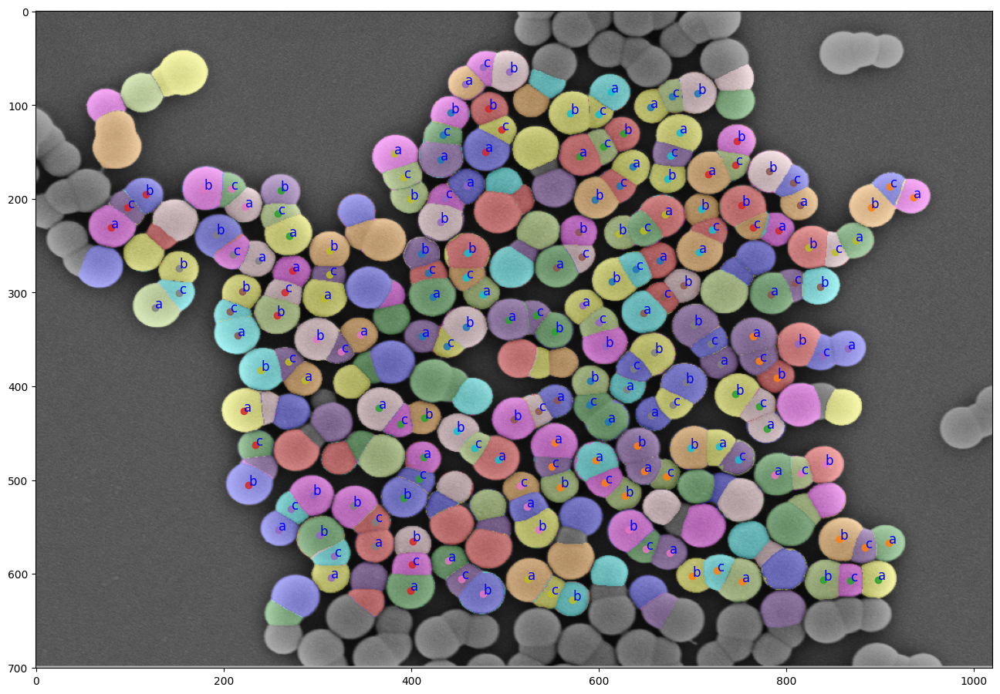

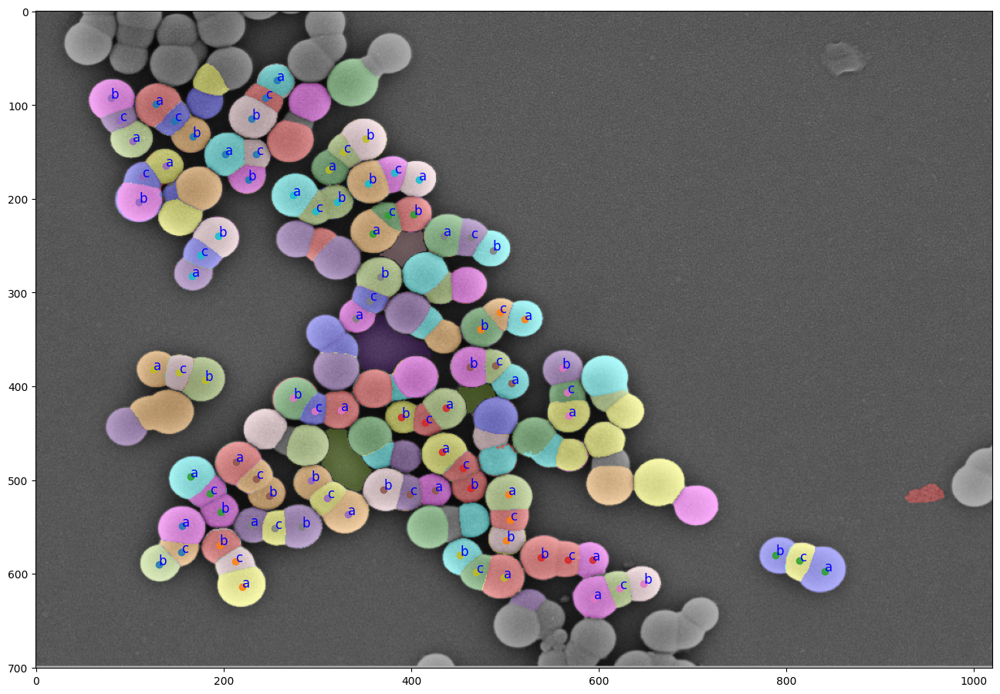

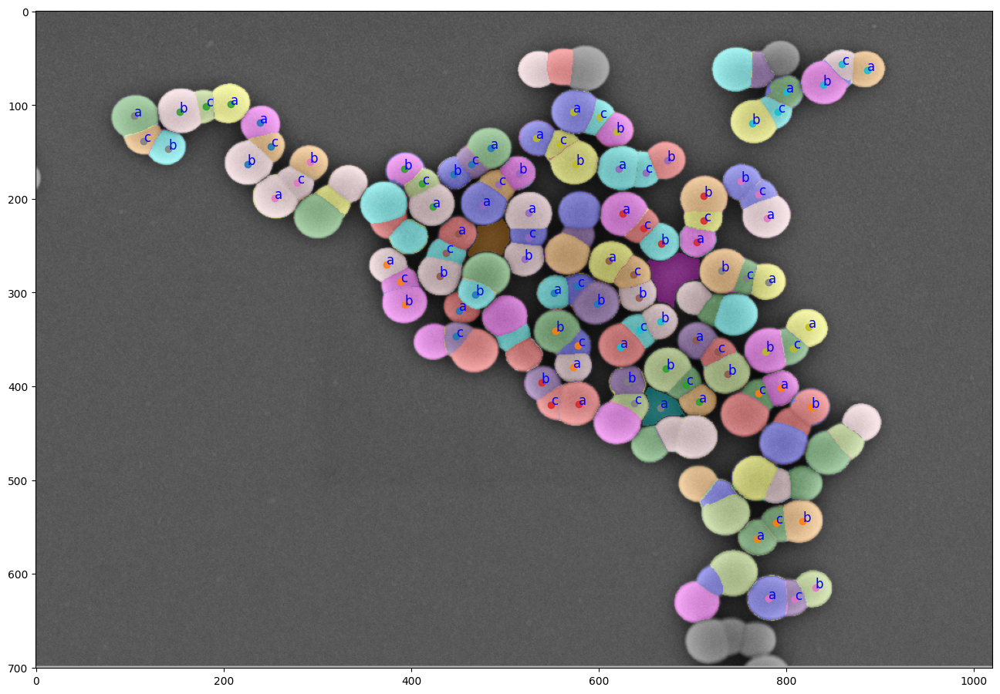

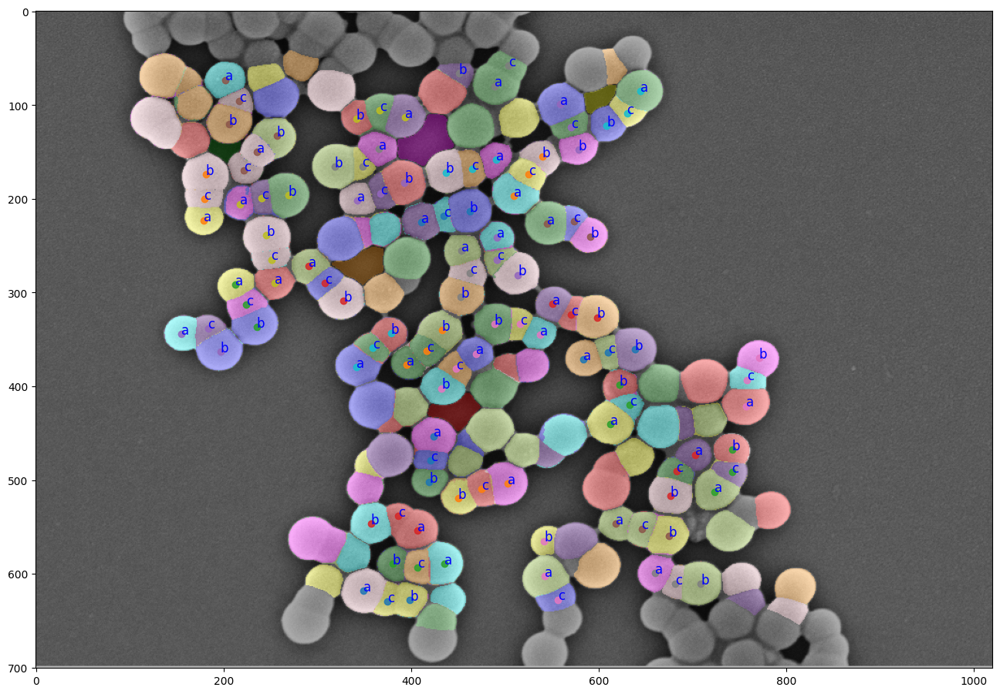

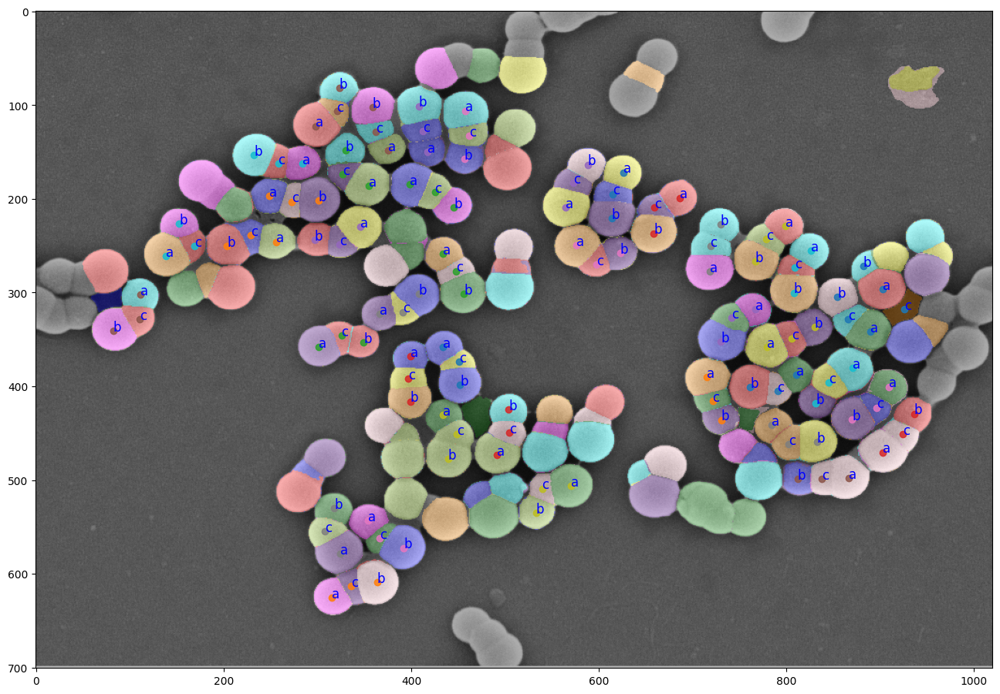

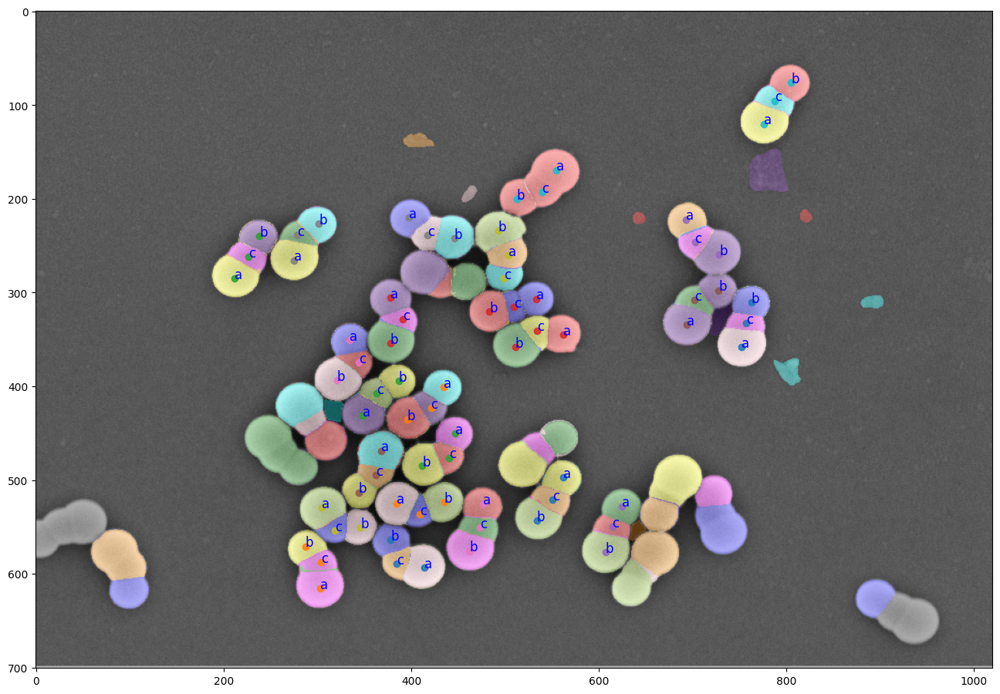

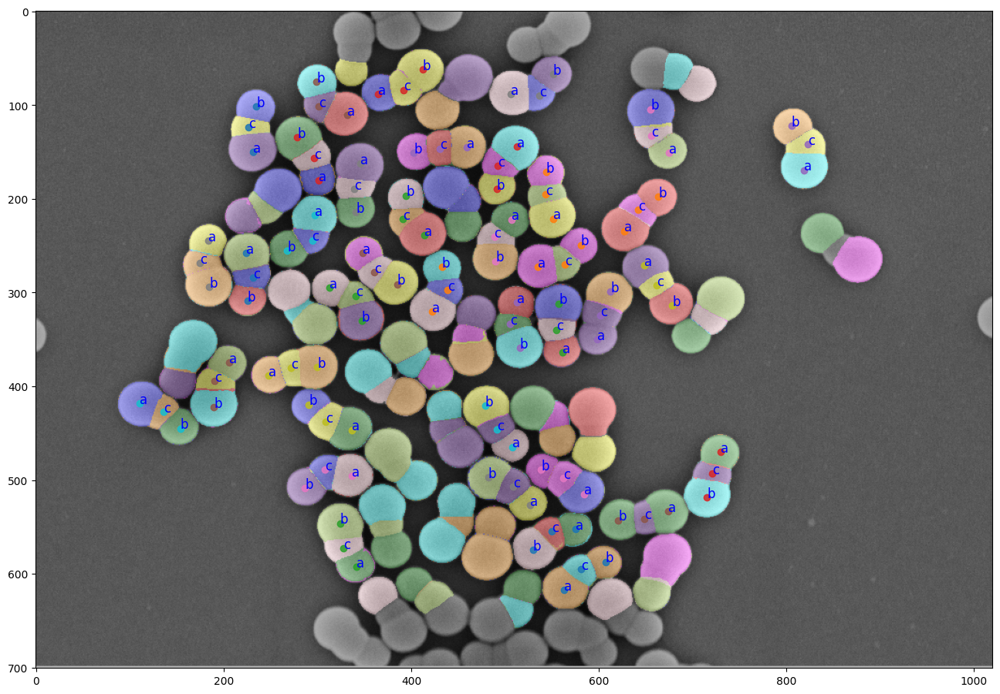

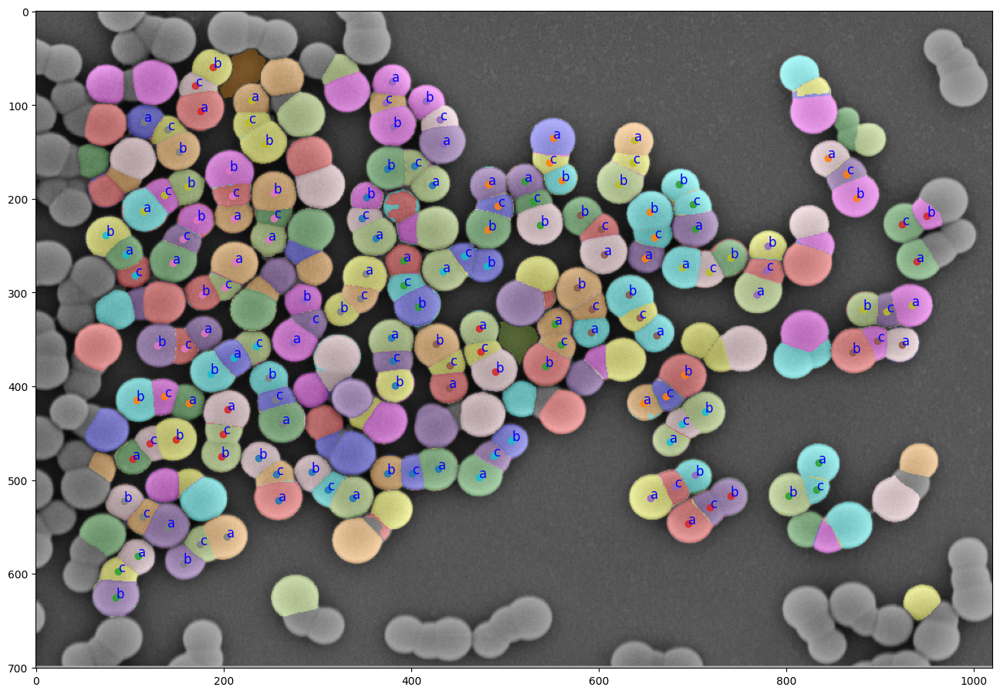

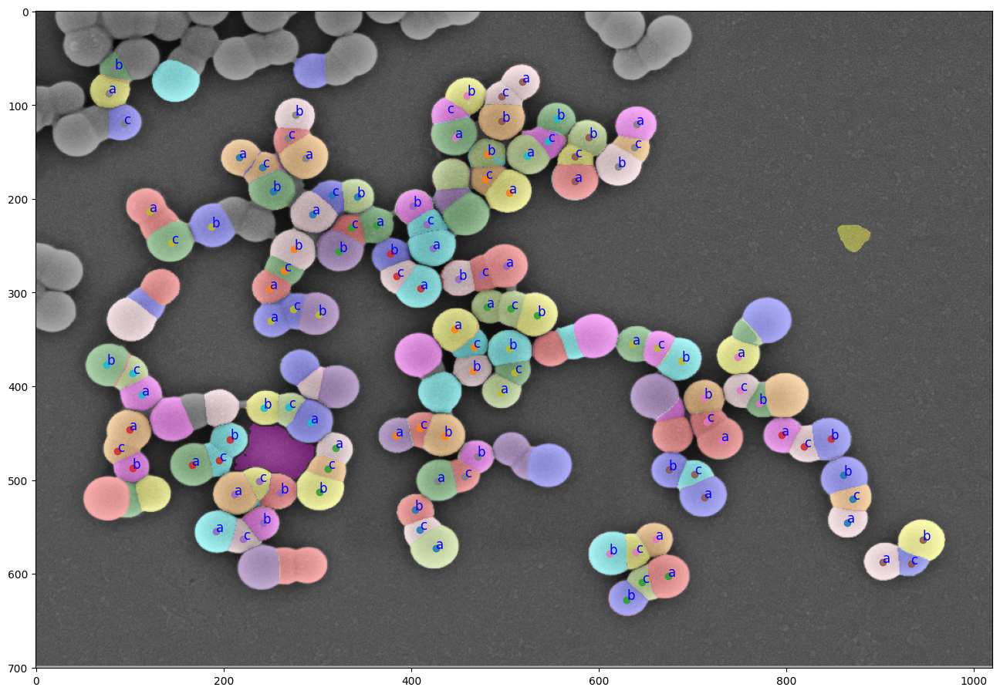

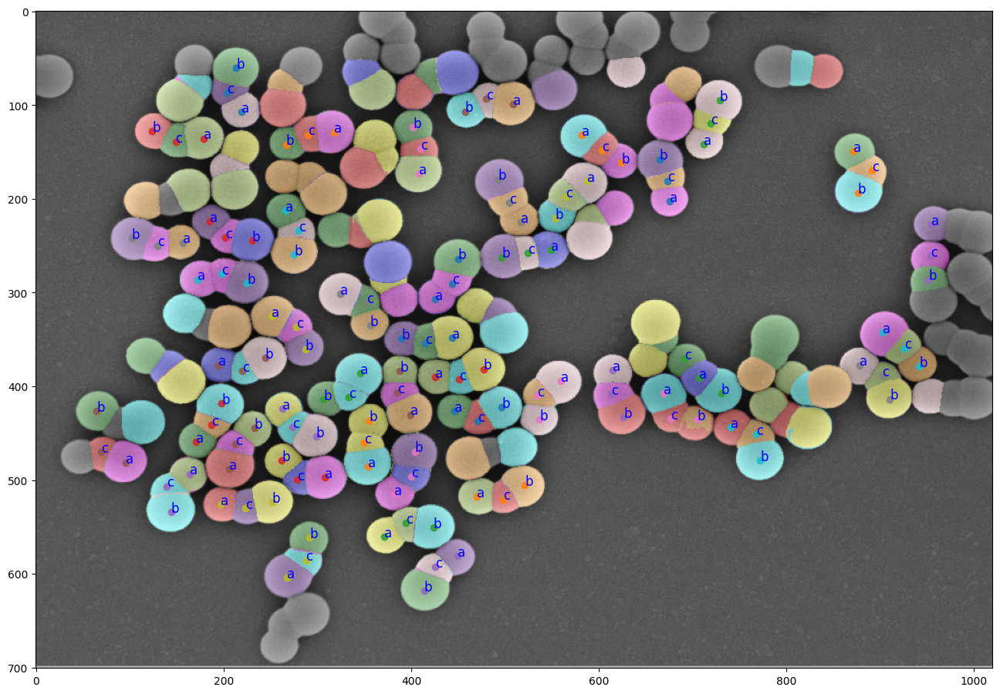

In [9]:
for idx in range(0,img_set.__len__()):

    print(f'{idx}/{img_set.__len__()}')

    img, name = img_set.__getitem__(idx)
    saving_name = name.split('.')[0]
    print(f'Analizing particle: {saving_name}')

    comined_mask, simple_mask, dataframe_SAM = SAM_analysis(img,mask_generator)
    # dataframe_SAM.to_excel(f'{save_path}/df_SAM_orig_{saving_name}.xlsx')
    #plot_seg_mask(img,comined_mask)

    comb_mask = get_cob_mask_from_sam(dataframe_SAM)
    #plot_seg_mask(img,comb_mask)

    sam_df = label_props_SAM(img,comb_mask)

    df_id_particle = define_id_particle_from_regionprops(sam_df)
    #plot_tripods_numbered(img, df_id_particle)

    triplet_all = assign_lobes(df_id_particle)
    triplet_all['img_name'] = name
    plot_lobes(triplet_all,comb_mask,img,save=True,name=saving_name)

    triplet_all.to_excel(f'{save_path}/df_analized_{saving_name}.xlsx')
    print(f'image from {name} saved!')

In [10]:

# data_path = os.path.join(os.getcwd(),save_path+'/')
files = os.listdir(save_path)
filtered_files = sorted([ f'{save_path}/'+r for r in files if  r.split('.')[-1]=='xlsx' ])
filtered_files = sorted([r for r in filtered_files if  r.split('_')[1]=='analized' ])
filtered_files

['/content/results/df_analized_GM 124_00.xlsx',
 '/content/results/df_analized_GM 124_01.xlsx',
 '/content/results/df_analized_GM 124_02.xlsx',
 '/content/results/df_analized_GM 124_03.xlsx',
 '/content/results/df_analized_GM 124_04.xlsx',
 '/content/results/df_analized_GM 124_05.xlsx',
 '/content/results/df_analized_GM 124_06.xlsx',
 '/content/results/df_analized_GM 124_07.xlsx',
 '/content/results/df_analized_GM 124_08.xlsx',
 '/content/results/df_analized_GM 124_09.xlsx']

In [11]:
init = True
for file in filtered_files:
    df_temp = pd.read_excel(file)
    if init:
        df_concat = df_temp.copy()
        init=False
    else:
        df_concat = pd.concat([df_concat,df_temp])
df_concat.to_excel(f'{save_path}/results_for_idx_{img_idx}.xlsx')

In [12]:
df_concat

,Unnamed: 0,area,convex_area,mean_intensity,label,perimeter,centroid,axis_major_length,feret_diameter_max,orientation,...,eccentricity,bbox,circularity,candidate,sum_dist,best_cand,ID,max_angle,lobe,img_name
0,76,893,930,[143.15677492 143.15677492 143.15677492],953,115.876154,"(258.2082866741321, 410.66069428891376)",38.193942,38.626416,-1.313546,...,0.606374,"(243, 393, 276, 430)",0.835744,"[76, 89, 58]",61.250093,"[89, 76, 102]",0,169.469454,b,GM 124_00.tif
1,89,612,693,[133.45098039 133.45098039 133.45098039],1110,108.183766,"(278.9787581699346, 418.3529411764706)",44.314229,40.521599,-1.351880,...,0.905343,"(267, 399, 292, 438)",0.657109,"[89, 76, 102]",48.447182,"[89, 76, 102]",0,NaN,c,GM 124_00.tif
2,102,1619,1659,[155.68004941 155.68004941 155.68004941],1235,151.053824,"(304.893761581223, 422.8252007411983)",50.749201,51.195703,-1.483934,...,0.594415,"(286, 398, 327, 448)",0.891648,"[102, 89, 91]",67.637921,"[89, 76, 102]",0,NaN,a,GM 124_00.tif
3,185,1029,1063,[128.28765792 128.28765792 128.28765792],2476,121.740115,"(507.43343051506315, 558.9154518950437)",41.712273,41.761226,-1.336887,...,0.642109,"(491, 539, 525, 579)",0.872485,"[185, 174, 195]",61.631449,"[174, 185, 161]",1,150.110525,b,GM 124_00.tif
4,174,632,656,[138.63449367 138.63449367 138.63449367],2395,104.284271,"(485.50474683544303, 549.6867088607595)",41.175982,40.024992,-1.529754,...,0.867055,"(477, 532, 498, 571)",0.730280,"[174, 185, 161]",49.630774,"[174, 185, 161]",1,NaN,c,GM 124_00.tif
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,70,954,1056,[157.59224319 157.59224319 157.59224319],797,123.083261,"(261.11215932914047, 953.3123689727463)",43.475721,42.720019,-1.527073,...,0.742124,"(247, 933, 277, 974)",0.791335,"[70, 74, 58]",58.990593,"[70, 74, 58]",44,NaN,c,GM 124_09.tif
134,58,1074,1109,[184.68715084 184.68715084 184.68715084],662,122.669048,"(227.231843575419, 954.2281191806331)",39.395792,41.048752,-0.378227,...,0.442417,"(209, 936, 246, 972)",0.896900,"[58, 70, 74]",92.868899,"[70, 74, 58]",44,NaN,a,GM 124_09.tif
135,126,1429,1466,[183.71448565 183.71448565 183.71448565],1512,141.195959,"(426.15255423372986, 64.56752974107768)",45.666272,47.539457,-0.944020,...,0.476823,"(406, 43, 449, 89)",0.900736,"[126, 147, 151]",107.251211,"[147, 151, 126]",45,119.302729,b,GM 124_09.tif
136,147,634,707,[155.77444795 155.77444795 155.77444795],1942,107.840620,"(469.9305993690852, 69.10094637223975)",39.229588,38.639358,-0.230980,...,0.815672,"(454, 58, 492, 85)",0.685069,"[147, 151, 126]",72.731944,"[147, 151, 126]",45,NaN,c,GM 124_09.tif
